In [143]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, classification_report



In [144]:

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")

# Carga de datos
df_train = pd.read_csv("../data/train/train.csv")
df_test = pd.read_csv("../data/processed/df_test_proce.csv")


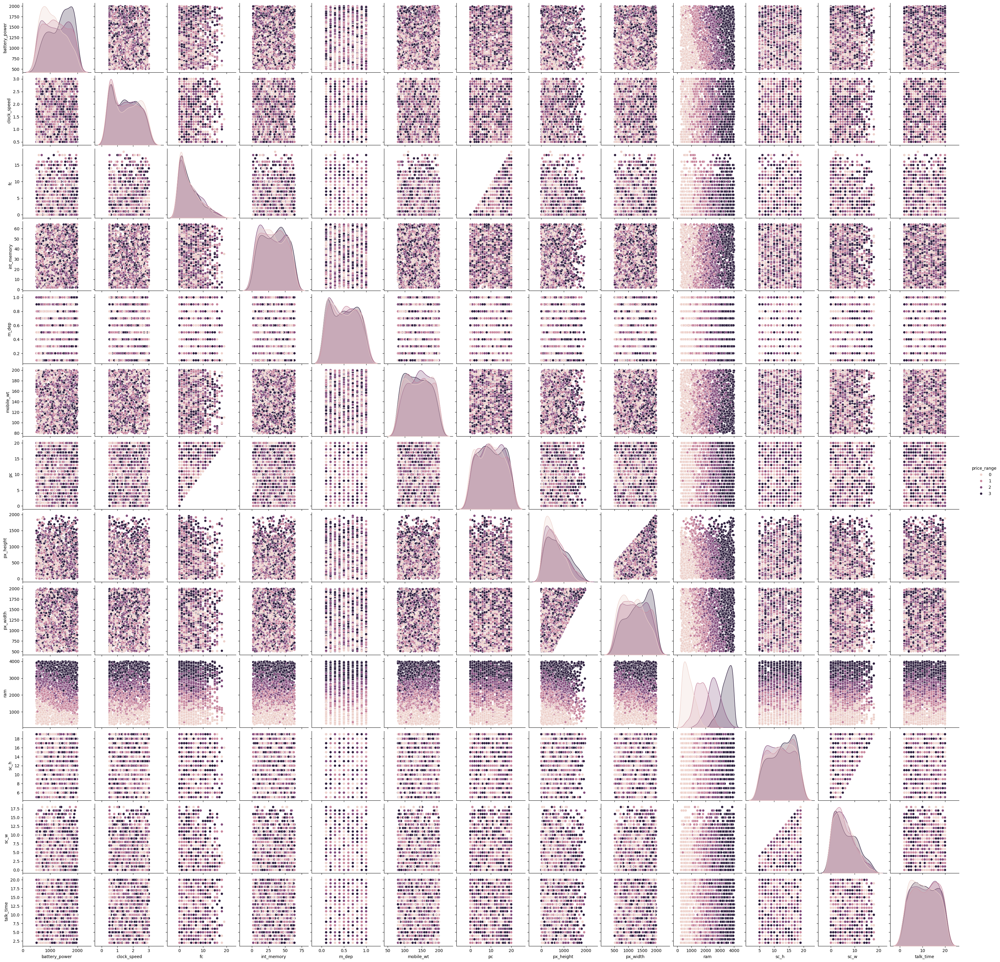

In [145]:
sns.pairplot(data=df_train[['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'pc', 'px_height',
                            'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'price_range']], 
             hue='price_range');

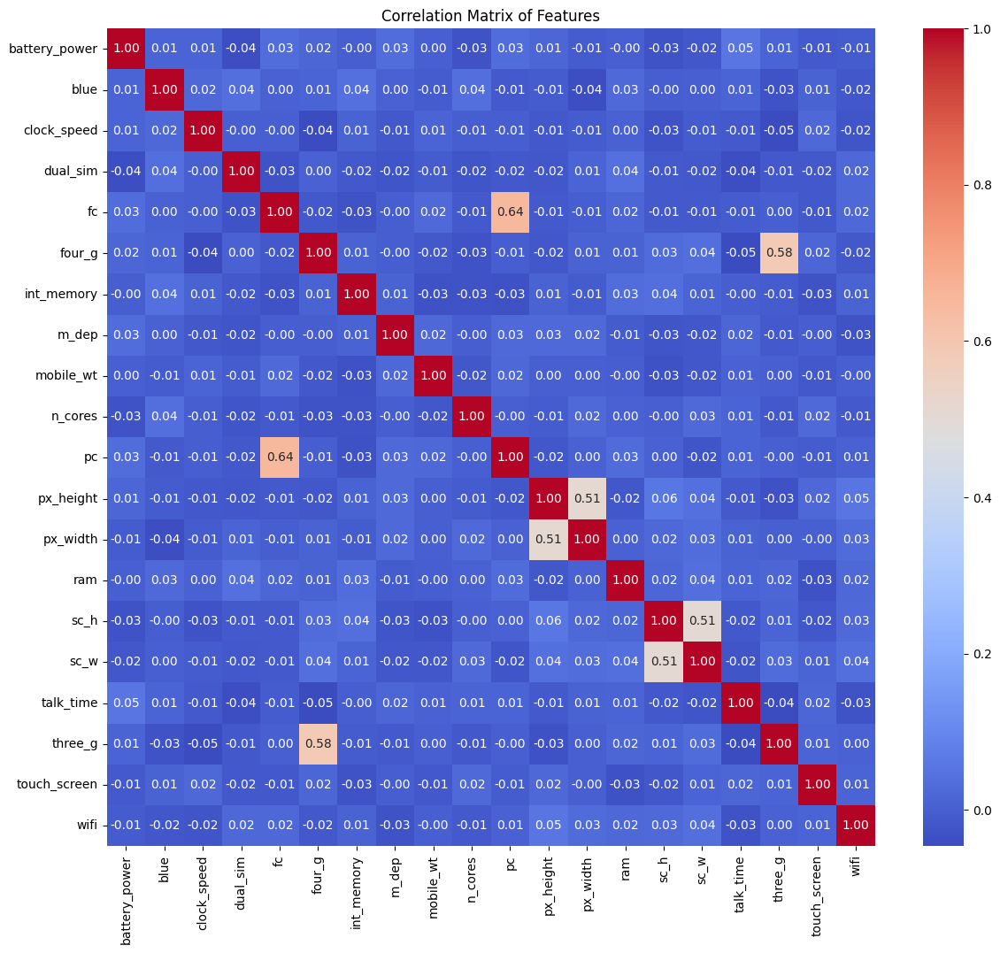

Variables con mayor correlación:
                 fc    four_g        pc  px_height  px_width      sc_h  \
fc              NaN       NaN  0.644595        NaN       NaN       NaN   
four_g          NaN       NaN       NaN        NaN       NaN       NaN   
pc         0.644595       NaN       NaN        NaN       NaN       NaN   
px_height       NaN       NaN       NaN        NaN  0.510664       NaN   
px_width        NaN       NaN       NaN   0.510664       NaN       NaN   
sc_h            NaN       NaN       NaN        NaN       NaN       NaN   
sc_w            NaN       NaN       NaN        NaN       NaN  0.506144   
three_g         NaN  0.584246       NaN        NaN       NaN       NaN   

               sc_w   three_g  
fc              NaN       NaN  
four_g          NaN  0.584246  
pc              NaN       NaN  
px_height       NaN       NaN  
px_width        NaN       NaN  
sc_h       0.506144       NaN  
sc_w            NaN       NaN  
three_g         NaN       NaN  


In [146]:
### Interpretación de Variables (Feature Importances)


# Gráfica de correlación de características
corr_matrix = df_train.drop('price_range', axis=1).corr()
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Matrix of Features")
plt.show()

# Descripción de la correlación
print("Variables con mayor correlación:")
correlation_threshold = 0.5
high_corr_vars = corr_matrix[(corr_matrix > correlation_threshold) & (corr_matrix != 1.0)]
print(high_corr_vars.dropna(axis=0, how='all').dropna(axis=1, how='all'))


In [147]:
# Definir una función para crear y mostrar un heatmap de la matriz de confusión
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=[f'Class {i}' for i in range(cm.shape[1])],
                yticklabels=[f'Class {i}' for i in range(cm.shape[0])])
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(title)
    plt.show()

# Binarizar las etiquetas para la clasificación multiclase
y_bin = label_binarize(y_val, classes=[0, 1, 2, 3])
n_classes = y_bin.shape[1]

def plot_roc_curve(y_true, y_score, n_classes, label):
    plt.figure(figsize=(12, 8))
    
    # Calcular la curva ROC para cada clase
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{label} (class {i}) AUC = {roc_auc:.2f}')
    
    # Configuración del gráfico
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {label}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

## Construcción del modelo

In [148]:
# Separación de características y target
X = df_train.drop('price_range', axis=1)
y = df_train['price_range']

# Escalado de características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)



In [149]:
# check the shape of X_train, X_test, y_train and y_test
print('X_train shape: ', X_train.shape)
print('X_test shape: ', X_val.shape)
print('y_train shape: ', y_train.shape)
print('y_test shape: ', y_val.shape)

X_train shape:  (1600, 20)
X_test shape:  (400, 20)
y_train shape:  (1600,)
y_test shape:  (400,)


In [150]:
# Preparación de los datos de test
X_test_scaled = scaler.transform(df_test)


### Modelo 1 - Random Forest (Regularización + Cross-Validation)

In [151]:
# Modelo Random Forest con cross-validation
rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
cv_scores_rf = cross_val_score(rf, X_train, y_train, cv=5)
rf.fit(X_train, y_train)
rf

RandomForestClassifier(max_depth=10, random_state=42)

In [152]:
y_pred_rf = rf.predict(X_val)
y_test_pred_rf = rf.predict(X_test_scaled)

# Evaluación
print("Random Forest Classifier:")
print("a - Cross-Validation Scores:", cv_scores_rf)
print("b - Mean CV Score:", cv_scores_rf.mean())
print("c - Accuracy on Validation:", accuracy_score(y_val, y_pred_rf))
print("d- Classification Report:\n", classification_report(y_val, y_pred_rf))


Random Forest Classifier:
a - Cross-Validation Scores: [0.853125 0.878125 0.86875  0.8375   0.85    ]
b - Mean CV Score: 0.8574999999999999
c - Accuracy on Validation: 0.8925
d- Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.97      0.95       105
           1       0.90      0.87      0.88        91
           2       0.80      0.85      0.83        92
           3       0.92      0.88      0.90       112

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.89      0.89      0.89       400



Training Random Forest...
Plotting ROC Curve for Random Forest...


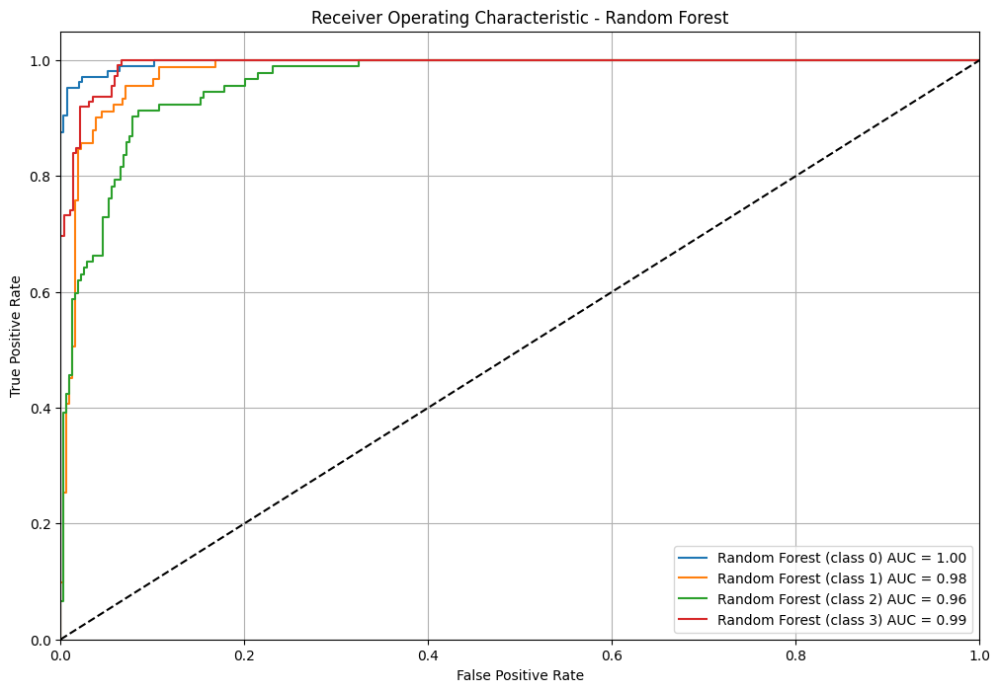

In [153]:
### Random Forest
print("Training Random Forest...")
y_score_rf = rf.predict_proba(X_val)
print("Plotting ROC Curve for Random Forest...")
plot_roc_curve(y_bin, y_score_rf, n_classes, 'Random Forest')


In [154]:
# Calcular la curva ROC para cada clase
fpr, tpr, thresholds = roc_curve(y_bin[:, 0], y_score_rf[:, 0])

# Crear un DataFrame con los valores FPR, TPR y Umbrales
roc_df = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr,
    'Threshold': thresholds
})

# Mostrar el DataFrame
print("ROC DataFrame:")
roc_df

ROC DataFrame:


,False Positive Rate,True Positive Rate,Threshold
0,0.000000,0.000000,inf
1,0.000000,0.009524,0.933188
2,0.000000,0.876190,0.564961
3,0.003390,0.876190,0.557037
4,0.003390,0.904762,0.535104
5,0.006780,0.904762,0.529864
6,0.006780,0.952381,0.485369
7,0.020339,0.952381,0.449789
8,0.020339,0.961905,0.435511
9,0.023729,0.961905,0.408036


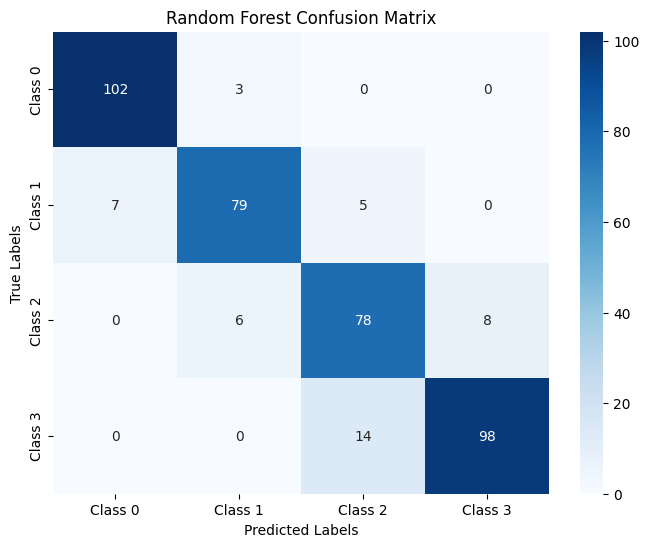

In [155]:
# Aplicar a Random Forest
plot_confusion_matrix(y_val, y_pred_rf, 'Random Forest Confusion Matrix')




In [156]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_val, y_pred_rf)

# Crear un DataFrame con la matriz de confusión
cm_df = pd.DataFrame(cm, 
                     index=[f'Actual {i}' for i in range(cm.shape[0])], 
                     columns=[f'Predicted {i}' for i in range(cm.shape[1])])

# Mostrar el DataFrame de la matriz de confusión
print("Confusion Matrix DataFrame:")
cm_df

Confusion Matrix DataFrame:


,Predicted 0,Predicted 1,Predicted 2,Predicted 3
Actual 0,102,3,0,0
Actual 1,7,79,5,0
Actual 2,0,6,78,8
Actual 3,0,0,14,98


### Modelo 2 - Support Vector Classifier (SVC) (Regularización + Cross-Validation)

In [157]:
# Modelo SVC con regularización y cross-validation
svc = SVC(C=1.0, kernel='rbf', probability=True, random_state=42)
cv_scores_svc = cross_val_score(svc, X_train, y_train, cv=5)
svc.fit(X_train, y_train)
svc


SVC(probability=True, random_state=42)

In [158]:
y_pred_svc = svc.predict(X_val)
y_score_svc = svc.predict_proba(X_val)

# Evaluación
print("Support Vector Classifier (SVC):")
print("a - Cross-Validation Scores:", cv_scores_svc)
print("b - Mean CV Score:", cv_scores_svc.mean())
print("c - Accuracy on Validation:", accuracy_score(y_val, y_pred_svc))
print("d -Classification Report:\n", classification_report(y_val, y_pred_svc))

Support Vector Classifier (SVC):
a - Cross-Validation Scores: [0.853125 0.89375  0.878125 0.846875 0.85    ]
b - Mean CV Score: 0.8643749999999999
c - Accuracy on Validation: 0.8925
d -Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94       105
           1       0.80      0.89      0.84        91
           2       0.84      0.82      0.83        92
           3       0.96      0.92      0.94       112

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.90      0.89      0.89       400



Training Support Vector Classifier...
Plotting ROC Curve for SVC...


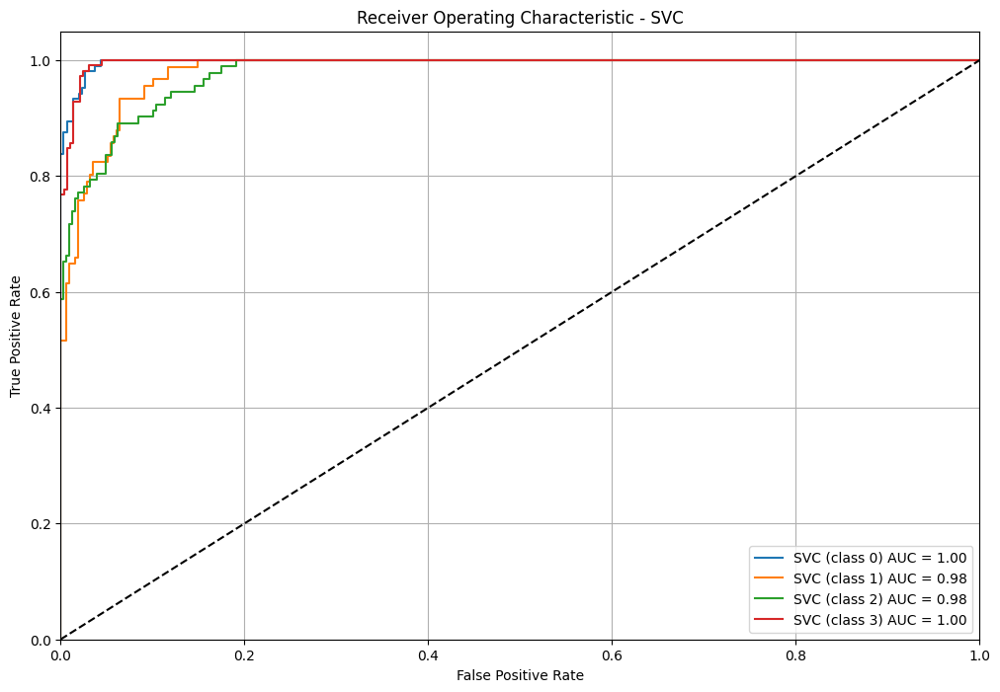

In [159]:
### Support Vector Classifier (SVC)
print("Training Support Vector Classifier...")
y_score_svc = svc.predict_proba(X_val)
print("Plotting ROC Curve for SVC...")
plot_roc_curve(y_bin, y_score_svc, n_classes, 'SVC')


In [160]:
# Entrenamiento del modelo SVC con predicciones de probabilidad
svc = SVC(C=1.0, kernel='rbf', probability=True, random_state=42)
svc.fit(X_train, y_train)
y_score_svc = svc.predict_proba(X_val)

# Binarizar las etiquetas para la clasificación multiclase
y_bin_val = label_binarize(y_val, classes=[0, 1, 2, 3])

# Calcular la curva ROC para cada clase
fpr, tpr, thresholds = roc_curve(y_bin_val[:, 0], y_score_svc[:, 0])

# Crear un DataFrame con los valores FPR, TPR y Umbrales
roc_df_svc = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr,
    'Threshold': thresholds
})

# Mostrar el DataFrame
roc_df_svc


,False Positive Rate,True Positive Rate,Threshold
0,0.000000,0.000000,inf
1,0.000000,0.009524,9.999985e-01
2,0.000000,0.838095,8.792199e-01
3,0.003390,0.838095,8.617762e-01
4,0.003390,0.876190,8.127037e-01
5,0.006780,0.876190,7.882164e-01
6,0.006780,0.895238,7.611694e-01
7,0.013559,0.895238,7.408671e-01
8,0.013559,0.933333,6.453066e-01
9,0.020339,0.933333,5.392909e-01


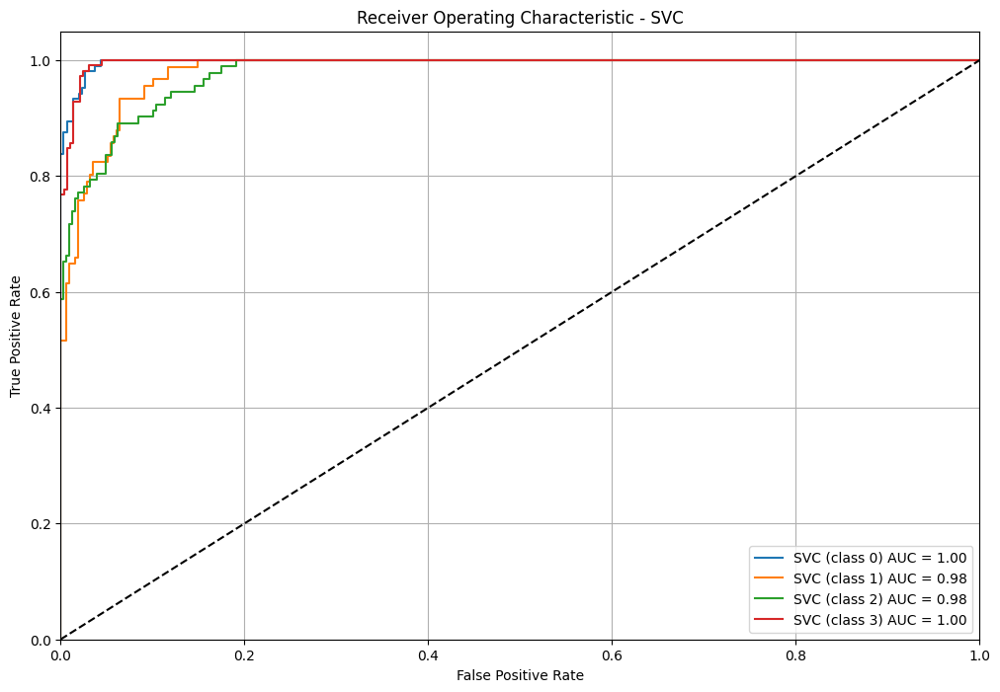

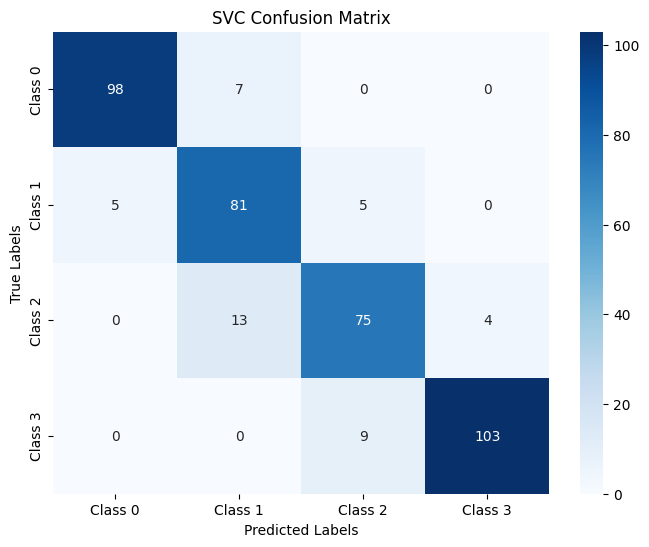

In [161]:
# Aplicar a SVC
plot_roc_curve(y_bin_val, y_score_svc, n_classes, 'SVC')
plot_confusion_matrix(y_val, y_pred_svc, 'SVC Confusion Matrix')


In [162]:
# Calcular la matriz de confusión
cm_svc = confusion_matrix(y_val, y_pred_svc)

# Convertir la matriz de confusión a un DataFrame
cm_df_svc = pd.DataFrame(cm_svc, 
                         index=[f'Actual {i}' for i in range(cm_svc.shape[0])], 
                         columns=[f'Predicted {i}' for i in range(cm_svc.shape[1])])

# Mostrar el DataFrame
cm_df_svc


,Predicted 0,Predicted 1,Predicted 2,Predicted 3
Actual 0,98,7,0,0
Actual 1,5,81,5,0
Actual 2,0,13,75,4
Actual 3,0,0,9,103


### Modelo 3 - Gradient Boosting (Regularización + Cross-Validation)

In [163]:
# Modelo Gradient Boosting con early stopping
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
cv_scores_gb = cross_val_score(gb, X_train, y_train, cv=5)
gb.fit(X_train, y_train)
gb

GradientBoostingClassifier(max_depth=5, random_state=42)

In [164]:
y_pred_gb = gb.predict(X_val)
y_test_pred_gb = gb.predict(X_test_scaled)

# Evaluación
print("Gradient Boosting Classifier:")
print("a - Cross-Validation Scores:", cv_scores_gb)
print("b - Mean CV Score:", cv_scores_gb.mean())
print("c - Accuracy on Validation:", accuracy_score(y_val, y_pred_gb))
print("d - Classification Report:\n", classification_report(y_val, y_pred_gb))


Gradient Boosting Classifier:
a - Cross-Validation Scores: [0.89375  0.9      0.896875 0.884375 0.903125]
b - Mean CV Score: 0.8956250000000001
c - Accuracy on Validation: 0.9175
d - Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.95      0.96       105
           1       0.89      0.95      0.91        91
           2       0.86      0.87      0.86        92
           3       0.94      0.90      0.92       112

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0.92      0.92       400



Training Gradient Boosting...
Plotting ROC Curve for Gradient Boosting...


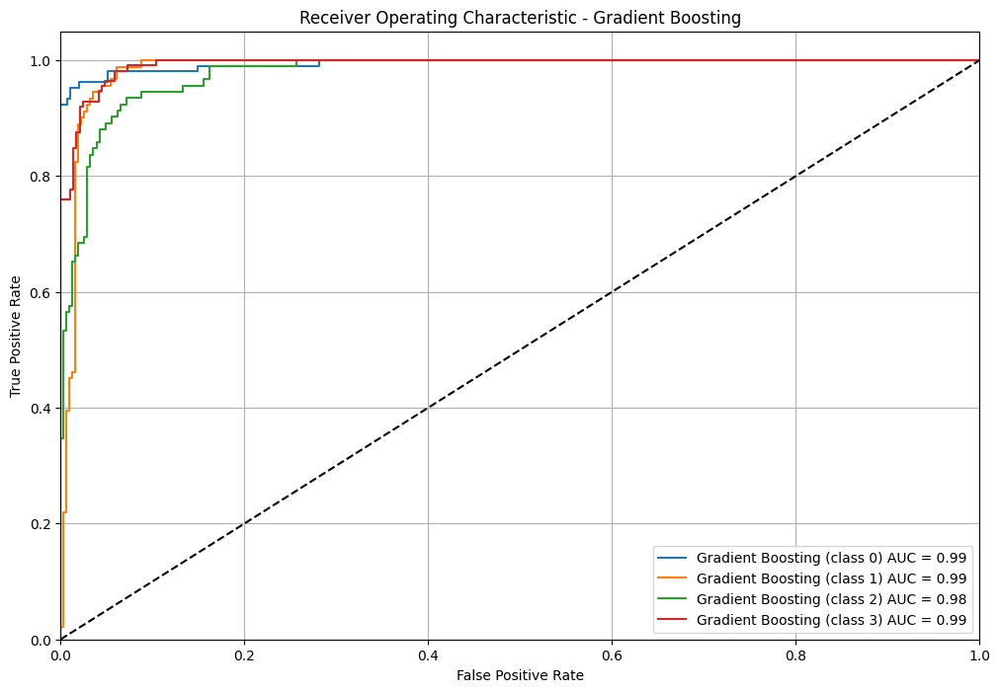

In [165]:
### Gradient Boosting
print("Training Gradient Boosting...")
y_score_gb = gb.predict_proba(X_val)
print("Plotting ROC Curve for Gradient Boosting...")
plot_roc_curve(y_bin, y_score_gb, n_classes, 'Gradient Boosting')


In [166]:
# Calcular la curva ROC para la primera clase (puedes repetir para otras clases si es multiclase)
fpr, tpr, thresholds = roc_curve(y_bin[:, 0], y_score_gb[:, 0])

# Crear un DataFrame con los valores FPR, TPR y umbrales
roc_df = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr,
    'Threshold': thresholds
})

# Mostrar el DataFrame
roc_df


,False Positive Rate,True Positive Rate,Threshold
0,0.000000,0.000000,inf
1,0.000000,0.009524,0.999961
2,0.000000,0.923810,0.782259
3,0.006780,0.923810,0.729310
4,0.006780,0.933333,0.635991
5,0.010169,0.933333,0.610127
6,0.010169,0.952381,0.504899
7,0.020339,0.952381,0.223806
8,0.020339,0.961905,0.208634
9,0.050847,0.961905,0.017877


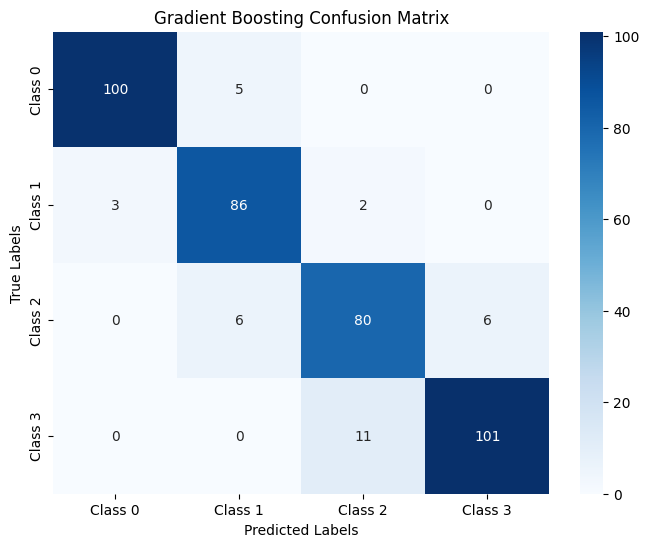

In [167]:

# Aplicar a Gradient Boosting
plot_confusion_matrix(y_val, y_pred_gb, 'Gradient Boosting Confusion Matrix')

In [168]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_val, y_pred_gb)

# Convertir la matriz de confusión en un DataFrame
cm_df = pd.DataFrame(cm, 
                     index=[f'Actual {i}' for i in range(cm.shape[0])], 
                     columns=[f'Predicted {i}' for i in range(cm.shape[1])])

# Mostrar el DataFrame
cm_df

,Predicted 0,Predicted 1,Predicted 2,Predicted 3
Actual 0,100,5,0,0
Actual 1,3,86,2,0
Actual 2,0,6,80,6
Actual 3,0,0,11,101


## Modelo 4 - Logistic Regression (Regularización L2)

In [169]:
# Modelo Logistic Regression con regularización L2
lr = LogisticRegression(C=1.0, solver='liblinear', random_state=42)
cv_scores_lr = cross_val_score(lr, X_train, y_train, cv=5)
lr.fit(X_train, y_train)
lr


LogisticRegression(random_state=42, solver='liblinear')

In [170]:
y_pred_lr = lr.predict(X_val)
y_test_pred_lr = lr.predict(X_test_scaled)

# Evaluación
print("Logistic Regression:")
print("a - Cross-Validation Scores:", cv_scores_lr)
print("b - Mean CV Score:", cv_scores_lr.mean())
print("c - Accuracy on Validation:", accuracy_score(y_val, y_pred_lr))
print("d - Classification Report:\n", classification_report(y_val, y_pred_lr))


Logistic Regression:
a - Cross-Validation Scores: [0.8375   0.83125  0.825    0.80625  0.803125]
b - Mean CV Score: 0.820625
c - Accuracy on Validation: 0.85
d - Classification Report:
               precision    recall  f1-score   support

           0       0.90      1.00      0.95       105
           1       0.79      0.63      0.70        91
           2       0.75      0.72      0.73        92
           3       0.91      1.00      0.95       112

    accuracy                           0.85       400
   macro avg       0.84      0.84      0.83       400
weighted avg       0.84      0.85      0.84       400



Training Logistic Regression...
Plotting ROC Curve for Logistic Regression...


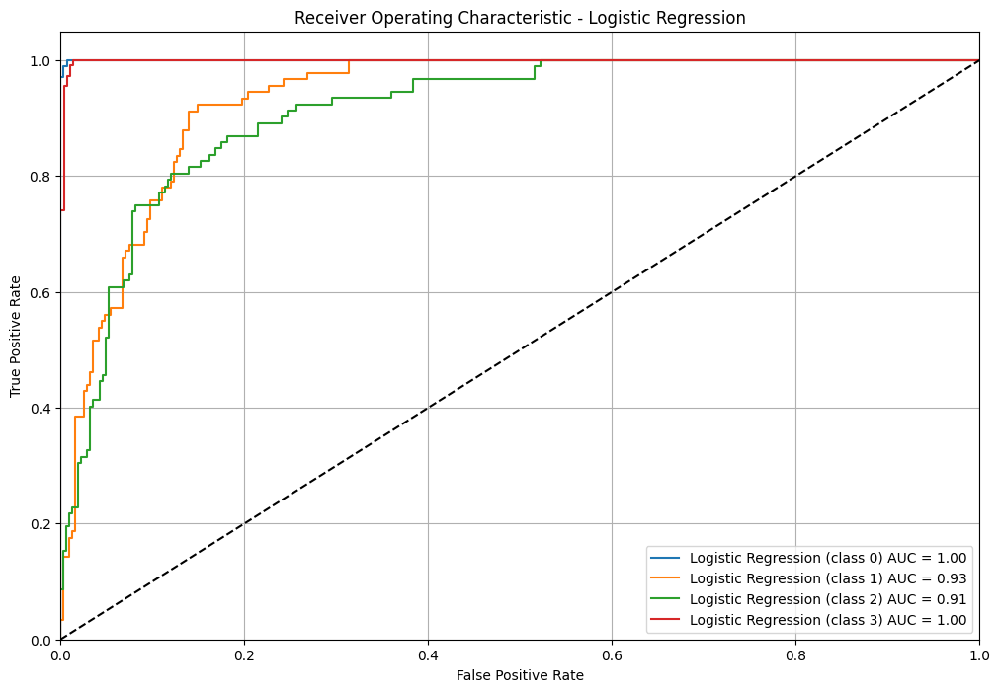

In [171]:
### Logistic Regression
print("Training Logistic Regression...")
y_score_lr = lr.predict_proba(X_val)
print("Plotting ROC Curve for Logistic Regression...")
plot_roc_curve(y_bin, y_score_lr, n_classes, 'Logistic Regression')

In [172]:
# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_bin[:, 0], y_score_lr[:, 0])

# Crear un DataFrame con los valores FPR, TPR y Thresholds
roc_df = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr,
    'Threshold': thresholds
})

# Mostrar el DataFrame
print("ROC DataFrame:")
roc_df.head()


ROC DataFrame:


,False Positive Rate,True Positive Rate,Threshold
0,0.00000,0.000000,inf
1,0.00000,0.009524,0.709769
2,0.00000,0.971429,0.530535
3,0.00339,0.971429,0.521456
4,0.00339,0.990476,0.494459


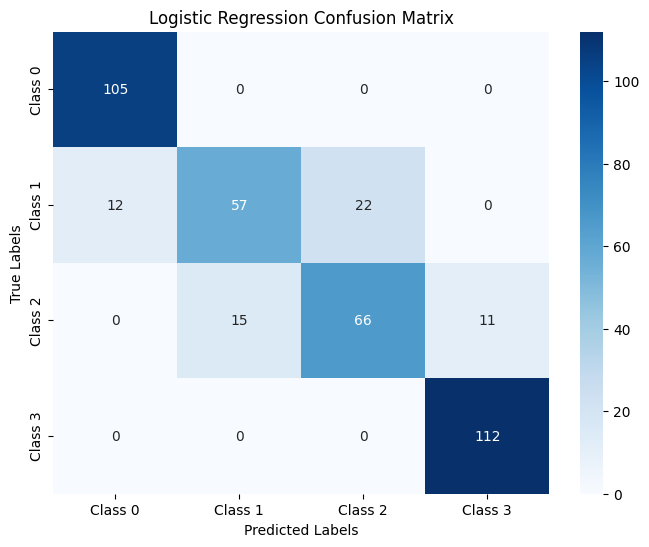

In [173]:
# Aplicar a Logistic Regression
plot_confusion_matrix(y_val, y_pred_lr, 'Logistic Regression Confusion Matrix')


In [174]:
# Calcular la matriz de confusión
cm = confusion_matrix(y_val, y_pred_lr)

# Crear un DataFrame para la matriz de confusión
cm_df = pd.DataFrame(cm, 
                     index=[f'Actual {i}' for i in range(cm.shape[0])], 
                     columns=[f'Predicted {i}' for i in range(cm.shape[1])])

# Mostrar el DataFrame
print("Confusion Matrix DataFrame:")
cm_df

Confusion Matrix DataFrame:


,Predicted 0,Predicted 1,Predicted 2,Predicted 3
Actual 0,105,0,0,0
Actual 1,12,57,22,0
Actual 2,0,15,66,11
Actual 3,0,0,0,112


K-Means Clustering (Modelo No Supervisado)

In [175]:
# Modelo KMeans con n_init especificado
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans.fit(X_scaled)
clusters = kmeans.predict(X_val)
clusters_test = kmeans.predict(X_test_scaled)

# Evaluación
print("KMeans Clustering (Validation Data):")
print(pd.crosstab(y_val, clusters))

print("KMeans Clustering (Test Data):")
print(pd.crosstab(clusters_test, clusters_test))


KMeans Clustering (Validation Data):
col_0         0   1   2   3
price_range                
0            19  25  23  38
1            21  22  16  32
2            16  21  28  27
3            33  27  30  22
KMeans Clustering (Test Data):
col_0    0    1    2    3
row_0                    
0      200    0    0    0
1        0  239    0    0
2        0    0  235    0
3        0    0    0  326


Interpretación de Variables 

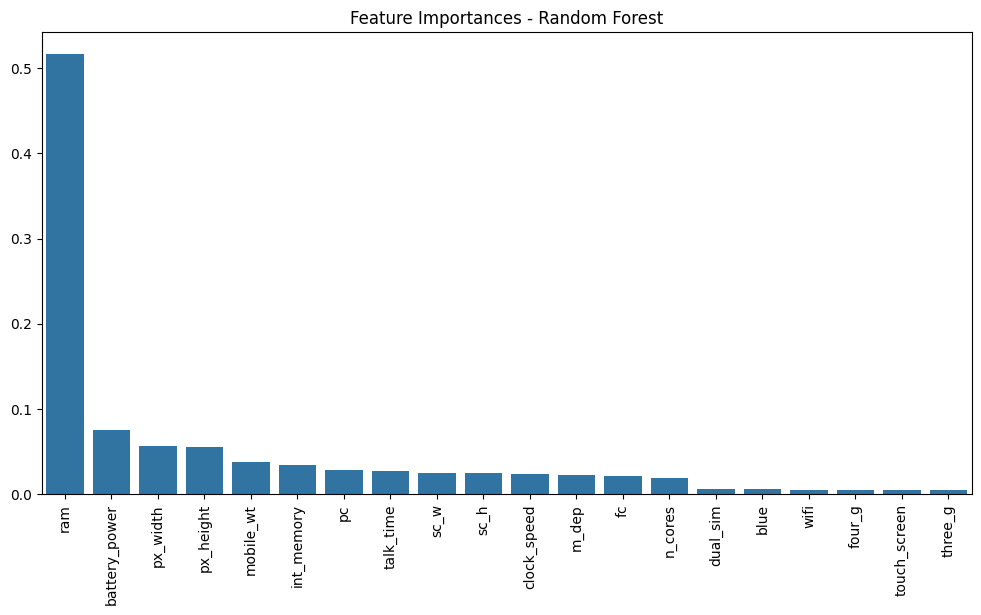

In [176]:
# Importancia de características para Random Forest
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Gráfico de barras de importancia de características
plt.figure(figsize=(12, 6))
sns.barplot(x=[X.columns[i] for i in indices], y=importances[indices])
plt.title("Feature Importances - Random Forest")
plt.xticks(rotation=90)
plt.show()


